DCGAN 튜토리얼_Pytorch
==============

**저자**: [Nathan Inkawhich](https://github.com/inkawhich)__
**역자**: [이철기](https://github.com/Feghi)__

Introduction
------------

GAN은 NIPS 2016년 `이안 굿펠로우(Ian Goodfellow)`가 튜토리얼에서 소개한 Generative Adversarial Network에서 시작되었습니다. 초기 GAN의 연구는 GAN 생성 네트워크를 FC(Fully Connected) 네트워크로 생성 하였으나, 추후 연구에서 FC네트워크 보다 CNN 구조의 네트워크가 더 좋은 성능을 보이는 것을 보였습니다. 이런 종류의 GAN을 DCGAN(Deep Convolutional Generative Adversarial Network)라고 부르고 최근에는 일반적으로 GAN 이라고 칭하면 DCGAN을 의미합니다.

해당 코드는 DCGAN의 예제 코드이고 [pytorch/examples](https://github.com/pytorch/examples)에서 제공 하는 튜토리얼 중에 일부입니다. 해당 문서에서 모델의 구현 및 실행에 대해 설명하고 있습니다.

GAN에 대한 기본적인 지식을 요하고 있는 코드이지만 처음 보시는 분들도 코드를 실행해가며 따라 할 수 있습니다.

GPU가 있으면(2개 까지) 코드의 실행 시간을 단축시킬 수 있습니다.


생성적 적대 신경망(Generative Adversarial Networks:GAN)
-------------------------------

#### GAN 이란?

GAN은 학습 데이터와 같은 분포를 갖는 새로운 데이터를 생성하는 과정을 통해 딥러닝 모델을 향상시키기 위한 하나의 프레임워크입니다. 앞서 설명한 이안 굿펠로우의 해당 논문 [Generative Adversarial Nets](https://papers.nips.cc/paper/5423-generative-adversarial-nets.pdf). 에서 처음 제시 되었습니다.

GAN에는 두개의 서로 다른 모델이 존제하는데 하나는 *생성자(generator)*이고 다른 하나는 *판별자(discriminator)* 입니다. *생성자*의 역할은 훈련데이터와 유사한 가짜 데이터를 생성하는 것이고 *판별자*의 역할은 입력 데이터가 원본 데이터에서 추출된 샘플인지 생성자가 만든 가짜 데이터인지 구별하는 일을 합니다.

GAN이 훈련하는 동안에 생성자는 판별자를 속이기 위해 점점 더 정교한 가짜 데이터를 생성하게 되고, 판별자는 가짜 데이터와 진짜 데이터를 더 민감하게 감지하게 됩니다. 이 게임의 평형점에 도달했을 때 생성자는 최고로 정교한 가짜 데이터를 생성하게 되고 이때의 판별자의 예측은 50%정도로 진짜인지 가짜 데이터인지 구별할 수 없게 됩니다.

튜토리얼에 앞서서 판별자에서 사용하는 몇몇 표기를 정의하면 $x$는 이미지 데이터 입니다. $D(x)$는 판별자 신경망 네트워크를 위미하고 출력 값은 해당 입력값이 진짜 데이터인지 가짜데이터인지를 판별하는 확률(스칼라)값을 출력합니다. 판별자에 입력되는 인풋 데이터는 HWC 사이즈 3x64x64크기 입니다. 직관적으로 판별자 $D(x)$의 출력값이 높으면 실제 데이터이고 낮으면 생성자가 생성한 데이터입니다. 판별자 $D(x)$는 기존 딥러닝에서 사용되는 이진 분류기로 생각할 수 있습니다.

생성자에서 사용하는 표기로는, $z$는 정규분포에서 샘플링된 잠재변수 공간입니다. $G(z)$는 생성자 신경망 네트워크를 의미하고 잠재변수가 입력변수로 들어가게 됩니다.  $G(z)$의 최종 목표는 판별자의 ($p_{data}$)값을 단서로 하여 훈련 데이터의 분포를 추정하는 것입니다. 추정된 데이터 분포 ($p_g$)에서 가짜 샘플 데이터를 생성 할 수 있습니다.

[굿 펠로우의 논문](https://papers.nips.cc/paper/5423-generative-adversarial-nets.pdf), 에 따르면 생성자 $G$와 판별자 $D$는 minmax 게임을 하게 됩니다. 판별자는 실제 훈련셋으로부터 추출된 데이터($logD(x)$)를 올바르게 분류할 확률을 최대화 하면서 가짜 데이터($log(1-D(G(x)))$)의 확률을 최소화 하게 됩니다.

논문에서 나온 GAN 판별자 $D$의 손실함수는 이진 크로스 엔트로피 손실 함수를 사용하였고 y=1과 y=0를 대입하면 아래와 같이 표현이 가능합니다.

\begin{align}\underset{G}{\text{min}} \underset{D}{\text{max}}V(D,G) = \mathbb{E}_{x\sim p_{data}(x)}\big[logD(x)\big] + \mathbb{E}_{z\sim p_{z}(z)}\big[log(1-D(G(x)))\big]\end{align}

#### DCGAN 이란?


DCGAN 합성곱 네트워크를 사용하여 기존의 GAN을 확장한 연구 입니다. Radford et. ['Unsupervised Representation Learning With
Deep Convolutional Generative Adversarial Networks'](https://arxiv.org/pdf/1511.06434.pdf). 판별자는 스트라이드 된 [컨볼루션 레이어](https://pytorch.org/docs/stable/nn.html#torch.nn.Conv2d), [배치 norm 레이어](https://pytorch.org/docs/stable/nn.html#torch.nn.BatchNorm2d) 및 [LeakyReLu 활성화 함수](https://pytorch.org/docs/stable/nn.html#torch.nn.LeakyReLU)로 구성되어 있습니다. 입력 데이터는 3x64x64 크기의 이미지 데이터이고 출력은 해당 이미지가 실제 데이터일 확률값(스칼라) 입니다. 생성자는 [Transposed 컨볼루션 레이어](https://pytorch.org/docs/stable/nn.html#torch.nn.ConvTranspose2d), 배치 norm 레이어, [ReLu 활성화 함수](https://pytorch.org/docs/stable/nn.html#relu)로 구성되어 있습니다. 생성자는 잠재 변수 벡터 $z$를 입력 받아 3x64x64 크기의 가상 RGB이미지를 출력하게 됩니다. 스트라이드 된 Transposed 컨볼루션 레이어는 잠재 변수를 이미지와 같은 크기를 갖는 벡터로 변환 시켜 줍니다. 논문에는 파라미터를 최적화 하는 방법과 모델 가중치를 초기화 하는 방법들에 대한 팁이 있습니다.


In [1]:
from __future__ import print_function
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Set random seem for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # 새로운 결과를 만드려면 랜덤 시드로
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


Inputs
------

입력 변수 정의:

-  **dataroot** - 데이터 센터의 경로를 의미함
-  **workers** - 데이터를 로드 하기 위한 스레드의 개수
-  **batch_size** - 학습에 사용되는 배치 크기 (DCGAN 논문의 경우 128)
-  **image_size** - 훈련에 사용된 이미지의 크기 기본값은 64x64임 다른 사이즈의 이미지를 하기 위해서는 판별자 $D$와 생성자$G$의 구조를 변경해야 함 (자세한 사항은 [여기](https://github.com/pytorch/examples/issues/70)
-  **nc** - 색상 체널 수 RGB의 경우 3
-  **nz** - 잠재 벡터의 길이
-  **ngf** - 생성자를 통해서 전달되는 feature 맵의 깊이
-  **ndf** - 판별자를 통해서 전달되는 feature 맵의 깊이
-  **num_epochs** - 에폭 수
-  **lr** - learning rate (DCGAN 논문에서는 무조건 0.0002로 해야 된다고 나옴)
-  **beta1** - 아담 옵티마이저 하이퍼 파라미터 (논문에서는 0.5)
-  **ngpu** - 그래픽 카드 개수, 0일 경우 CPU만 사용해서 학습

In [10]:
# Root directory for dataset
dataroot = "img_align_celeba"

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 5

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1


Data
----

튜토리얼에서는 [Celeb-A Faces dataset](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html)을 사용하게 됩니다. 홈페이지 외에도 아래의 [구글 드라이브](https://drive.google.com/drive/folders/0B7EVK8r0v71pTUZsaXdaSnZBZzg)에서 다운로드 가능
압축 파일로 다운로드 받은 데이터 셋을 코드 경로에 unzip을 해야 합니다.

이 과정은 ImageFolderdataset 클래스를 사용하기 위해서 중요한 과정입니다. 해당 클래스의 경우 데이터 세트를 루트 폴더에 하위 폴더로 있어야 합니다. 이제 데이터 세트를 만들고, 데이터 로더를 만들고, 장치가 실행되도록 설정하고, 마지막으로 훈련 데이터를 시각화 할 수 있습니다.




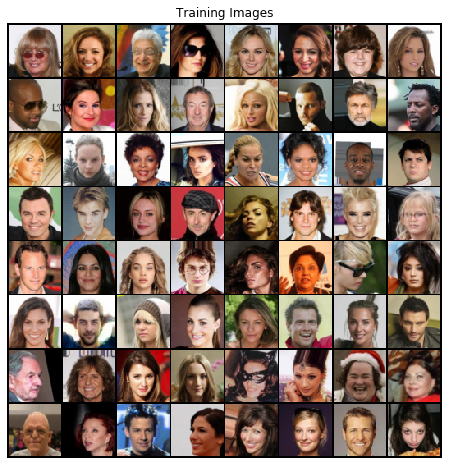

In [11]:
# ImageFolder를 사용해서 이미 폴더 사용
# 데이터 셋 만들기
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
#  데이터 로더 만들기
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# GPU, CPU 선택
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# 일부 이미지 그리기
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

코드 구현
--------------

입력 파라미터와 데이터 세트가 준비되면 이제 구현에 들어갈 수 있습니다. 가중치 초기화를 시작으로 생성자, 판벌자, 손실함수 및 반복 학습에 대해 시작합니다.

#### 가중치 초기화


DCGAN 논문에서 저자는 모든 모델을 N(0,0.2)의 분포에서 랜덤 초기화를 합니다. ``weights_init``함수는 모든 합성곱, transposed  함성곱, 배치 정규화 레이어를 초기화 하는 함수입니다. 이 함수는 초기화 후에 모델에 즉시 적용되게 됩니다.

In [12]:
# 판별자 및 생성자 가중치 초기화
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

#### 생성자(Generator)

생성자 $G$는 잠재 공간 벡터$z$를 데이터 공간에 매핑하도록 디자인 되었씁니다. 우리의 데이터는 이미지 데이터 이기 때문에 생성자는 잠재 공간 벡터$z$를 훈련 데이터와 같은 사이즈(i.e. 3x64x64)의 RGB 이미지 공간으로 변환하게 됩니다. 실제로 이것은 2차원 transposed 합성곱 레이어에 의해 완성된다. 생성자의 출력은 tanh함수를 통해서 만들어지고 $[-1,1]$의 험위를 갖는다. 여기서 합성곱 후에 배치 정규화층이 있는 것이 DCGAN 논문에 주요 공헌중의 하나 입니다. 이 레이어 들은 훈련 시 그라디언트 흐름에 도움을 주게 됩니다. DCGAN 생성자의 네트워크 구조는 아래와 같습니다.

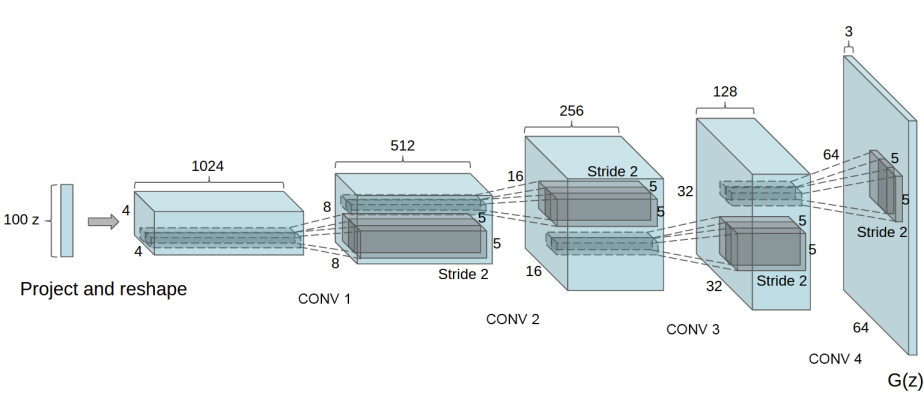

세팅한 입력  변수(*nz*, *ngf*, and *nc*)들이 코드 내에 생성자 구조에 영향을 주게 됩니다. *nz*는 z 잠재 벡터의 길이이고, *ngf* 는 생성자를 통해 전파되는 feature map의 크기와 관련이 있고, *nc* 는 출력 이미지의 채널수 입니다. (RGB 이미지의 경우 3 채널). 아래 생성자 코드 입니다.

In [13]:
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # 입력 벡터 Z를 합성곱 층으로 이동
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # 현재 사이즈, (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # 현재 사이즈, (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # 현재 사이즈, (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # 현재 사이즈, (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # 현재 사이즈, (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

이제 생성자를 인스턴스화하고 초기화 함수 ``weights_init``를 적용 할 수 있습니다. 프린트된 모델을 확인하여 생성자의 구조를 확인할 수 있습니다.

In [15]:
# 생성자 생성
netG = Generator(ngpu).to(device)

# 원할 경우 멀티 GPU 처리
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# weights_init 함수를 적용하여 가중치 초기화
#  to mean=0, stdev=0.2.
netG.apply(weights_init)

# 모델 프린트
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


#### 판별자(Discriminator)

앞에서 서술한 바와 같이 판별자 $D$는 이미지를 입력으로 하여 이미지가 실제 데이터에서 나왔을 확률(스칼라)을 보여주는 이진 분류기 이다. 여기서 판별자 $D$는 3x64x64 사이즈의 입력 이미지를 가져와서 Conv2d, BatchNorm2d 및 LeakyReLU 레이어를 거친 후 후 Sigmoid 활성화 함수를 통해 최종 확률값을 출력하게 됩니다. 필요한 경우 아키텍처를 더 많은 계층으로 확장 할 수 있지만 스트라이드 컨벌루션, Batch Norm 및 LeakyReLU를 사용하는 것이 중요합니다. DCGAN 논문에서 언급하기로는 스트라이드 합성곱이 풀링 다운 샘플링보다 더 좋은 결과를 보여준다고 말하고 있습니다. 또한 BatchNorm2d 및 LeakyReLU 레이어는 판별자와 생성자 모두에게 괜찮은 그라디언트 흐름을 제공합니다.

판별자 코드는 아래와 같습니다.

In [16]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)


이제 생성자와 마찬가지로 판별자를 만들고 ``weight_init``함수를 적용하고 모델을 프린트합니다.

In [17]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


### 손실 함수와 옵티마이저



In [18]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1
fake_label = 0

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [19]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
[0/5][0/1583]	Loss_D: 1.3801	Loss_G: 5.8675	D(x): 0.6567	D(G(z)): 0.5287 / 0.0045
[0/5][50/1583]	Loss_D: 0.2050	Loss_G: 22.3031	D(x): 0.8974	D(G(z)): 0.0000 / 0.0000
[0/5][100/1583]	Loss_D: 0.2138	Loss_G: 6.3895	D(x): 0.9373	D(G(z)): 0.0982 / 0.0042
[0/5][150/1583]	Loss_D: 0.4076	Loss_G: 3.1832	D(x): 0.7789	D(G(z)): 0.0748 / 0.0559
[0/5][200/1583]	Loss_D: 0.4065	Loss_G: 3.4284	D(x): 0.8695	D(G(z)): 0.1629 / 0.0673
[0/5][250/1583]	Loss_D: 0.4641	Loss_G: 4.4990	D(x): 0.7513	D(G(z)): 0.0482 / 0.0229
[0/5][300/1583]	Loss_D: 0.6287	Loss_G: 4.5872	D(x): 0.8974	D(G(z)): 0.3287 / 0.0308
[0/5][350/1583]	Loss_D: 0.5823	Loss_G: 2.6653	D(x): 0.6866	D(G(z)): 0.0761 / 0.1068
[0/5][400/1583]	Loss_D: 0.3491	Loss_G: 4.2669	D(x): 0.8670	D(G(z)): 0.1522 / 0.0261
[0/5][450/1583]	Loss_D: 0.6447	Loss_G: 6.0698	D(x): 0.9679	D(G(z)): 0.3960 / 0.0057
[0/5][500/1583]	Loss_D: 0.4367	Loss_G: 2.9904	D(x): 0.7920	D(G(z)): 0.1028 / 0.0809
[0/5][550/1583]	Loss_D: 0.4772	Loss_G: 4.3625	D(x): 

[3/5][0/1583]	Loss_D: 0.6968	Loss_G: 2.8992	D(x): 0.8464	D(G(z)): 0.3708 / 0.0704
[3/5][50/1583]	Loss_D: 0.6464	Loss_G: 1.9609	D(x): 0.6947	D(G(z)): 0.1983 / 0.1717
[3/5][100/1583]	Loss_D: 1.1781	Loss_G: 0.6086	D(x): 0.3901	D(G(z)): 0.0494 / 0.5782
[3/5][150/1583]	Loss_D: 0.8501	Loss_G: 1.8999	D(x): 0.5831	D(G(z)): 0.1660 / 0.1952
[3/5][200/1583]	Loss_D: 0.7046	Loss_G: 3.1035	D(x): 0.8109	D(G(z)): 0.3482 / 0.0606
[3/5][250/1583]	Loss_D: 0.7864	Loss_G: 3.9955	D(x): 0.9466	D(G(z)): 0.4581 / 0.0258
[3/5][300/1583]	Loss_D: 0.7579	Loss_G: 3.2277	D(x): 0.8660	D(G(z)): 0.4175 / 0.0493
[3/5][350/1583]	Loss_D: 0.6034	Loss_G: 2.0711	D(x): 0.7298	D(G(z)): 0.2171 / 0.1622
[3/5][400/1583]	Loss_D: 0.8358	Loss_G: 1.3547	D(x): 0.5778	D(G(z)): 0.1672 / 0.2992
[3/5][450/1583]	Loss_D: 0.9381	Loss_G: 1.2087	D(x): 0.4742	D(G(z)): 0.0700 / 0.3463
[3/5][500/1583]	Loss_D: 0.6713	Loss_G: 3.4103	D(x): 0.8488	D(G(z)): 0.3629 / 0.0445
[3/5][550/1583]	Loss_D: 0.6088	Loss_G: 2.2806	D(x): 0.8008	D(G(z)): 0.2872 / 0.

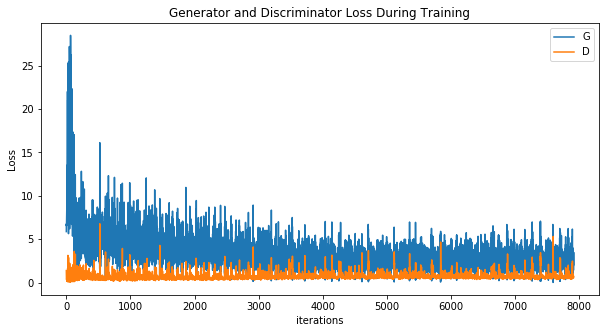

In [20]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

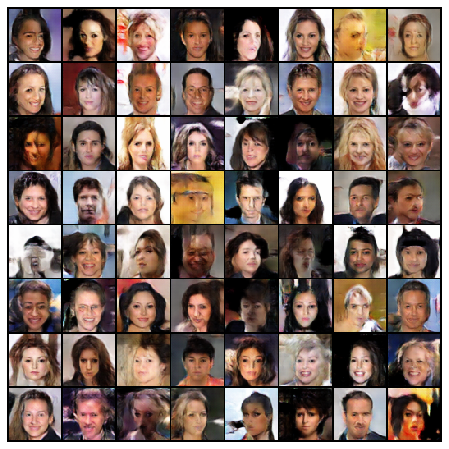

In [21]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

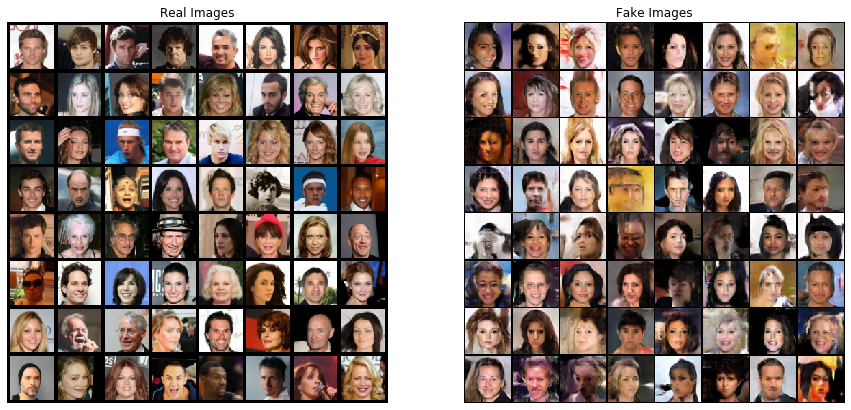

In [22]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()
